In [2]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import muon as mu
import anndata as ad
from muon import prot as pt
import squidpy as sq
import scanpy as sc
import plotnine as p9
import decoupler as dc

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import liana as li
from liana.method import MistyData
li.__version__

'1.0.0a0'

In [4]:
rna_path = "data/GSE213264/GSM6578062_humantonsil_RNA.tsv.gz"
prot_path = "data/GSE213264/GSM6578071_humantonsil_protein.tsv.gz"

In [5]:
rna = pd.read_csv(rna_path, sep="\t")
prot_orig = pd.read_csv(prot_path, sep="\t")
prot = prot_orig.copy()
prot_orig.columns = [re.sub("\\.[AGCT]{15}", "", s) for s in prot_orig.columns]
assert set(rna.X) == set(prot.X)

rna = rna.set_index("X")
prot = prot.set_index("X")
prot_orig = prot_orig.set_index("X")
prot = prot.loc[rna.index]
prot_orig = prot_orig.loc[rna.index]
assert np.all(rna.index == prot.index)
assert np.all(rna.index == prot_orig.index)

In [6]:
# clean protein names
cleaned_names = prot.columns
cleaned_names = [re.sub("\\.[AGCT]{15}", "", s) for s in prot.columns]
cleaned_names = [re.sub("anti\\.mouse\\.human", "", s) for s in cleaned_names]
cleaned_names = [re.sub("anti\\.human\\.mouse", "", s) for s in cleaned_names]
cleaned_names = [re.sub("anti\\.mouse\\.rat\\.human", "", s) for s in cleaned_names]
cleaned_names = [re.sub("anti\\.mouse\\.rat", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Mouse", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Rat", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Human", "", s) for s in cleaned_names]
cleaned_names = [re.sub("isotype\\.Ctrl", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Isotype\\.Ctrl", "", s) for s in cleaned_names]
cleaned_names = [re.sub("\\.\\.k", "", s) for s in cleaned_names]
cleaned_names = [re.sub("\\.+$", "", s) for s in cleaned_names]
cleaned_names = [re.sub("^\\.+", "", s) for s in cleaned_names]
prot.columns = cleaned_names

In [7]:
# get coordinates
def get_coord(col):
    x_coord = [s.split("x")[0] for s in col]
    y_coord = [s.split("x")[1] for s in col]
    df_coord = pd.DataFrame({"x": x_coord, "y": y_coord})
    df_coord = df_coord.apply(pd.to_numeric)
    return df_coord
coord = get_coord(rna.index)

obs_df = rna.index.to_frame(name="name")
obs_df["x"] = coord["x"].to_numpy()
obs_df["y"] = coord["y"].to_numpy()

spatial = obs_df.copy().loc[:, ["x", "y"]]
spatial

,x,y
X,,
29x42,29,42
44x36,44,36
34x6,34,6
42x19,42,19
41x6,41,6
...,...,...
2x26,2,26
30x26,30,26
23x48,23,48


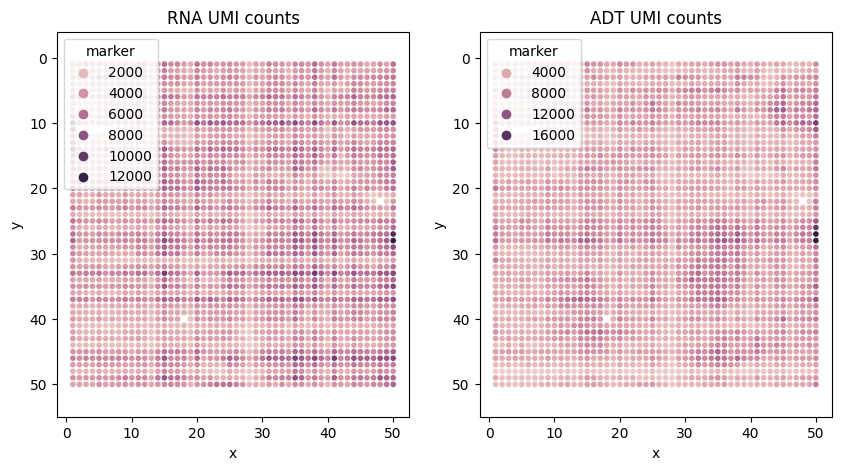

In [8]:
# QC plots
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

plot_df = spatial.copy()
plot_df["marker"] = rna.sum(axis=1)
sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], s=20)
axs[0].axis('equal')
axs[0].invert_yaxis()
axs[0].set_title("RNA UMI counts")

plot_df = spatial.copy()
plot_df["marker"] = prot_orig.sum(axis=1)
sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], s=20)
axs[1].axis('equal')
axs[1].invert_yaxis()
axs[1].set_title("ADT UMI counts")
plt.show()

In [9]:
# remove spike ins from rna
print(rna.shape)
spike_bool = np.array(["ERCC" in c for c in rna.columns])
print(spike_bool.sum())
rna = rna.loc[:,~spike_bool]
print(rna.shape)

# remove unmapped from protein
print(prot.shape)
unmapped_bool = np.array(["unmapped" in c for c in prot.columns])
print(unmapped_bool.sum())
prot = prot.loc[:,~unmapped_bool]
print(prot.shape)

(2492, 28417)
29
(2492, 28388)
(2492, 283)
1
(2492, 282)


In [10]:
rna_ad = sc.AnnData(X=rna.values, obs=rna.index.to_frame(name="id"), var=rna.columns.to_frame(name="gene"), obsm={"spatial": spatial})
sc.pp.normalize_total(rna_ad, target_sum=1e4)
sc.pp.log1p(rna_ad)
rna_ad.raw = rna_ad
rna_ad

AnnData object with n_obs × n_vars = 2492 × 28388
    obs: 'id'
    var: 'gene'
    uns: 'log1p'
    obsm: 'spatial'

In [11]:
# get cytosig
cytosig = pd.read_csv("https://raw.githubusercontent.com/data2intelligence/CytoSig/master/CytoSig/signature.centroid", sep="\t")
cytosig = cytosig.unstack().reset_index().rename(columns={'level_0':'source', 'level_1':'target', 0:'weight'})

In [12]:
dc.run_ulm(
    mat=rna_ad,
    net=cytosig,
    source="source",
    target="target",
    weight="weight",
    verbose=True,
    use_raw=False
)

333 features of mat are empty, they will be removed.
Running ulm on mat with 2492 samples and 28055 targets for 43 sources.


In [65]:
acts = li.ut.obsm_to_adata(rna_ad, 'ulm_estimate')
li.ut.spatial_neighbors(acts, cutoff=0, bandwidth=2.5, set_diag=True)
#li.pl.connectivity(acts, idx=0)

In [55]:
df = pd.DataFrame(acts.X, index=acts.obs.index, columns=acts.var.index).reset_index().melt(id_vars="X")

# group by X and compute mean value
df = df.groupby(["X", "variable"]).mean().reset_index()

df["x"] = [s.split("x")[0] for s in df.X]
df["y"] = [s.split("x")[1] for s in df.X]

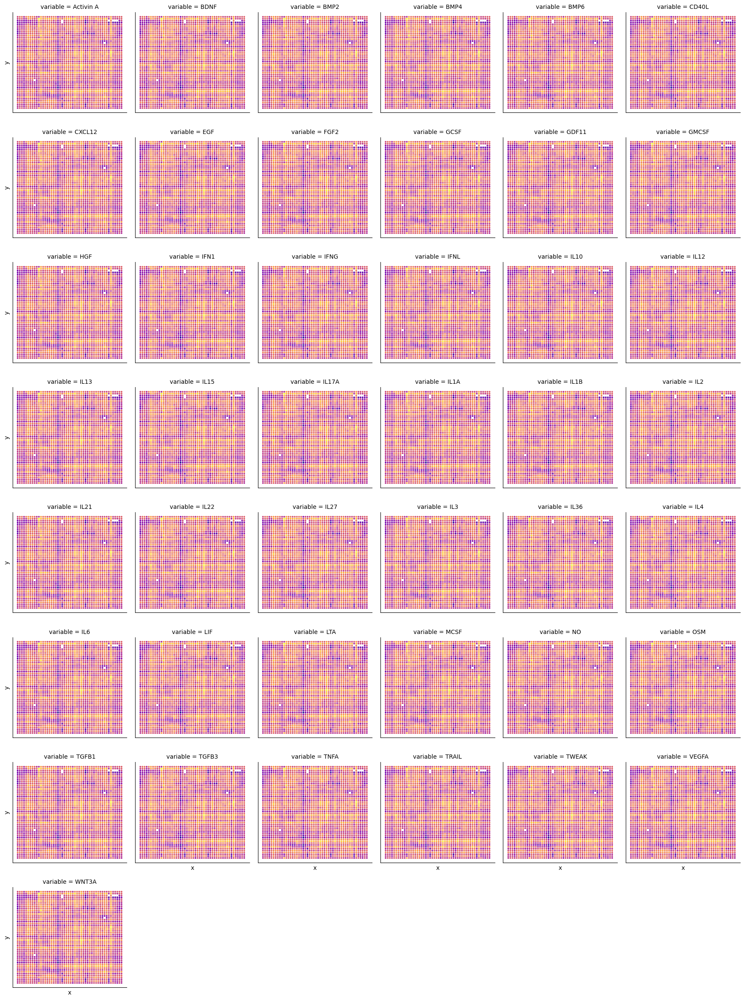

In [67]:
# Create the FacetGrid with scatterplots
g = sns.FacetGrid(data=df, col="variable", col_wrap=6)
scatter_plot = g.map(sns.scatterplot, "x", "y", "value", s=10, palette="plasma")
# Remove x and y ticks and labels from each facet
for ax in g.axes.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
plt.show()

In [16]:
prot_ad = sc.AnnData(X=prot.values, obs=prot.index.to_frame(name="id"), var=prot.columns.to_frame(name="protein"), obsm={"spatial": spatial})

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [17]:
misty = MistyData(data={"intra": prot_ad, "para": acts})
misty.var_names_make_unique() # otherwise we cannot index
misty

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:445: UserWarning: var_names are not unique. To make them unique, call `.var_names_make_unique`.


MuData object with n_obs × n_vars = 2492 × 325
  obs:	'id'
  2 modalities
    intra:	2492 x 282
      obs:	'id'
      var:	'protein'
      obsm:	'spatial'
    para:	2492 x 43
      obs:	'id'
      uns:	'log1p'
      obsm:	'spatial', 'ulm_estimate', 'ulm_pvals'
      obsp:	'spatial_connectivities'

In [35]:
#model = ["linear", "rf"]
misty.__call__(model="linear", verbose=True, bypass_intra=True)

Now learning: HLA.DR_.DP_.DQ: 100%|██████████| 282/282 [00:27<00:00, 10.32it/s]               


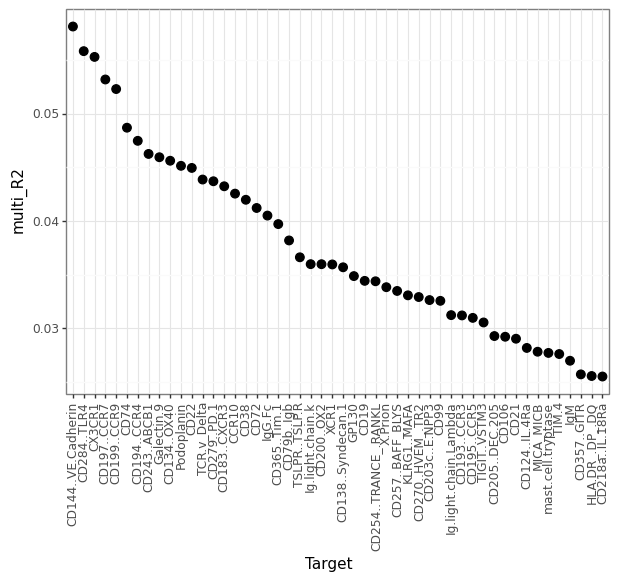

<ggplot: (360945183)>

In [36]:
stat = "multi_R2"
target_metrics = misty.uns['target_metrics'].copy()

target_metrics = target_metrics.sort_values(stat, ascending=False).head(50)

# get order of target by decreasing intra.R2
targets = target_metrics.sort_values(by=stat, ascending=False)['target'].values
# targets as categorical variable
target_metrics['target'] = pd.Categorical(target_metrics['target'],
                                            categories=targets, 
                                            ordered=True)

p = (p9.ggplot(target_metrics, p9.aes(x='target', y=stat)) +
        p9.geom_point(size=3) + 
        p9.theme_bw() +
        p9.theme(axis_text_x=p9.element_text(rotation=90),
                figure_size=(7,5)) +
    p9.labs(x='Target')
    )
p

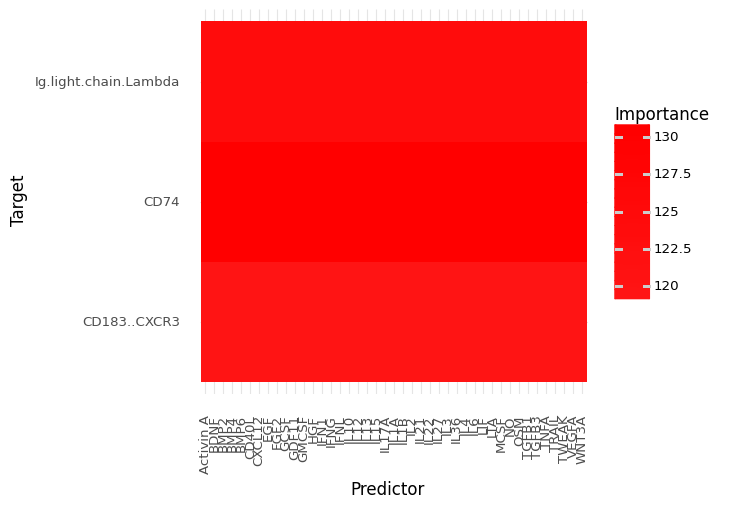

<ggplot: (728071388)>

In [37]:
(
    li.pl.interactions(misty, 'para', return_fig=True, figure_size=(5, 5), top_n=100, key=abs) +
    p9.scale_fill_gradient2(low = "blue", mid = "white", high = "red", midpoint = 0) +
    p9.labs(y='Target', x='Predictor')
)

In [54]:
interactions = [
    ("CD21", "KRAS_SIGNALING_UP"),
    ("CD5", "APICAL_SURFACE"),
    ("CD55", "MYC_TARGETS_V1"),
    ("CD82", "MYC_TARGETS_V1")
]

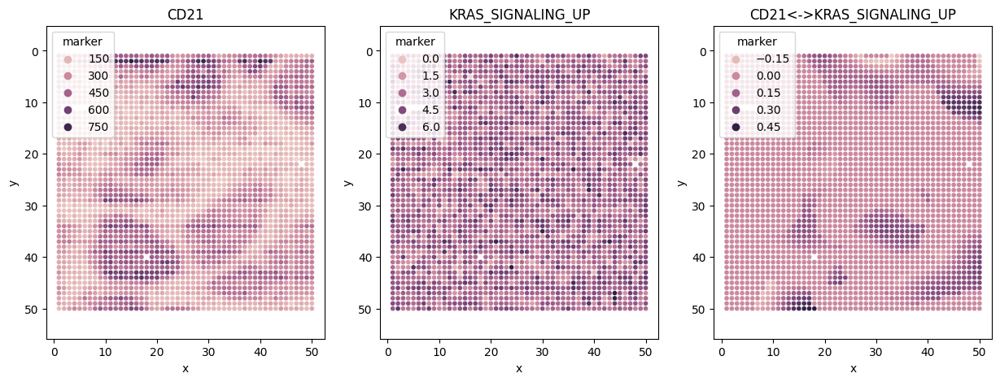

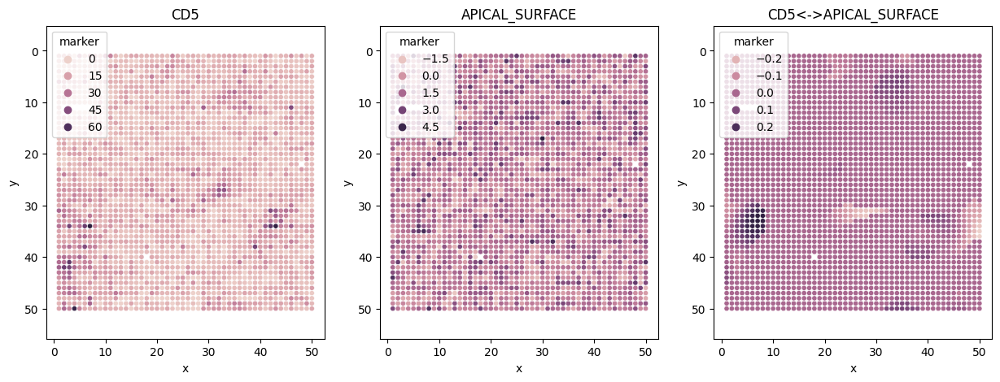

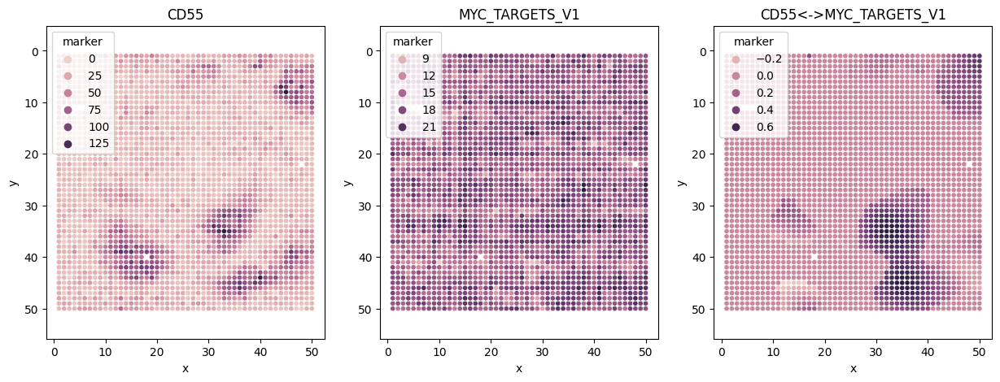

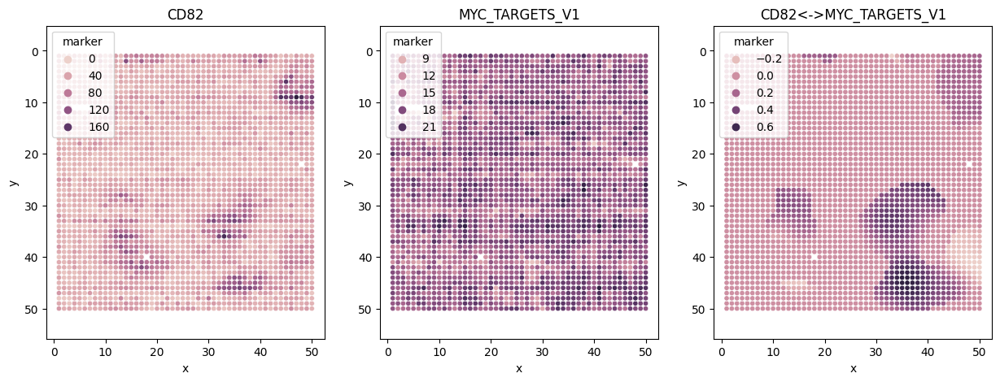

In [55]:
mdata = mu.MuData({"intra": misty.mod["intra"], "para": misty.mod["para"]})
mdata.obsm = misty.mod["para"].obsm
mdata.obsp = misty.mod["para"].obsp
mdata

li.mt.bivar(mdata,
            x_mod="intra",
            y_mod="para",
            #x_transform=li.ut.zi_minmax,
            #y_transform=li.ut.zi_minmax,
            x_transform=sc.pp.scale,
            y_transform=sc.pp.scale,
            function_name="cosine",
            interactions=interactions,
            #positive_only=False,
            positive_only=True,
            add_categories=True,
            xy_sep="<->",
            )

for i in range(len(interactions)):
    var = mdata.mod['local_scores'].var_names[i]
    var1 = var.split("<->")[0]
    var2 = var.split("<->")[1]

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    # plot intra
    plot_df = mdata.mod['intra'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['intra'][:, var1].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], s=20)
    axs[0].axis('equal')
    axs[0].invert_yaxis()
    axs[0].set_title(var1)

    # plot extra
    plot_df = mdata.mod['para'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['para'][:, var2].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], s=20)
    axs[1].axis('equal')
    axs[1].invert_yaxis()
    axs[1].set_title(var2)

    # plot bivariate
    plot_df = mdata.mod['local_scores'].obsm["spatial"]
    plot_df["marker"] = mdata.mod['local_scores'].X[:, i]
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[2], s=20)
    axs[2].axis('equal')
    axs[2].invert_yaxis()
    axs[2].set_title(var)

    plt.show()